# 78 - 画像→テキスト実験総括

## 概要
本ノートブックは、Notebook 71-77 で実施した画像→テキスト変換・検索実験の全結果を統合し、
包括的な比較分析を行う最終まとめである。

## 実験シリーズの全体像

| NB | テーマ | モデル/手法 | タイプ |
|:---:|:---|:---|:---:|
| 71 | 擬似キャプション（タグベース/プール検索） | SigLIP 2 Large | タグベース |
| 72 | BLIP-2 キャプション生成 | Salesforce/blip2-opt-2.7b | キャプション生成 |
| 73 | Florence-2 マルチタスク | microsoft/Florence-2-large-ft | キャプション生成 |
| 74 | Qwen2.5-VL 多言語キャプション | Qwen/Qwen2.5-VL-7B-Instruct | VLM |
| 75 | InternVL2.5 キャプション | (InternVL2.5-8B) | VLM |
| 76 | キャプション拡張検索パイプライン | SigLIP 2 + Captions | ハイブリッド |
| 77 | ColPali 遅延相互作用 | vidore/colqwen2-v1.0 | Late Interaction |

## 評価軸
- **Self-Retrieval Score**: キャプションembedding と画像embeddingのコサイン類似度
- **Retrieval MRR**: テキストクエリ→画像検索の平均逆順位
- **速度**: 処理速度（画像/秒）
- **VRAM**: GPUメモリ使用量
- **日本語対応**: 日本語キャプション/検索の品質
- **OCR 能力**: 画像内テキスト抽出の可否

In [1]:
import json
from datetime import datetime
from pathlib import Path

import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import numpy as np
import pandas as pd
import seaborn as sns
from glob import glob

# 日本語フォント設定（環境に応じて調整）
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['figure.dpi'] = 150

print("Imports loaded.")

Imports loaded.


## 1. 全評価結果の読み込み

In [2]:
eval_dir = Path("../data/evaluations")

# 各ノートブックの結果ファイルを検索
result_patterns = {
    "71": "71_*",
    "72": "72_*",
    "73": "73_*",
    "74": "74_*",
    "75": "75_*",
    "76": "76_*",
    "77": "77_*",
}

all_results = {}

for nb_num, pattern in result_patterns.items():
    files = sorted(eval_dir.glob(f"{pattern}.json"))
    if files:
        # 最新のファイルを使用
        with open(files[-1]) as f:
            all_results[nb_num] = json.load(f)
        print(f"NB{nb_num}: Loaded {files[-1].name}")
    else:
        print(f"NB{nb_num}: No results found (pattern: {pattern})")

print(f"\nLoaded results: {len(all_results)} / {len(result_patterns)}")

NB71: Loaded 71_retrieval_captioning_2026-02-19.json
NB72: Loaded 72_blip2_captioning_2026-02-19.json
NB73: No results found (pattern: 73_*)
NB74: Loaded 74_qwen25vl_captioning_2026-02-19.json
NB75: Loaded 75_internvl_comparison_2026-02-20.json
NB76: Loaded 76_caption_enhanced_search_2026-02-20.json
NB77: No results found (pattern: 77_*)

Loaded results: 5 / 7


## 2. 包括的比較 DataFrame の構築

In [3]:
# 全モデル/手法の比較テーブルを構築
comparison_rows = []

# NB71: タグベース / プールベース擬似キャプション
if "71" in all_results:
    d = all_results["71"]
    methods = d.get("methods", {})
    ret_rank = d.get("retrieval_rank", {})
    comparison_rows.append({
        "Notebook": "NB71",
        "Model": "SigLIP 2 Large (Tag-based)",
        "Type": "tag-based",
        "VRAM_GB": 3.0,
        "Self_Retrieval_EN": methods.get("tag_based", {}).get("self_retrieval_en_mean", None),
        "Self_Retrieval_JA": methods.get("tag_based", {}).get("self_retrieval_ja_mean", None),
        "Retrieval_MRR_EN": ret_rank.get("en", {}).get("mrr", None),
        "Retrieval_MRR_JA": ret_rank.get("ja", {}).get("mrr", None),
        "Japanese_Support": "Limited",
        "OCR_Capability": "No",
    })
    comparison_rows.append({
        "Notebook": "NB71",
        "Model": "SigLIP 2 Large (Pool-based)",
        "Type": "tag-based",
        "VRAM_GB": 3.0,
        "Self_Retrieval_EN": methods.get("pool_based", {}).get("self_retrieval_en_mean", None),
        "Self_Retrieval_JA": methods.get("pool_based", {}).get("self_retrieval_ja_mean", None),
        "Retrieval_MRR_EN": ret_rank.get("en", {}).get("mrr", None),
        "Retrieval_MRR_JA": ret_rank.get("ja", {}).get("mrr", None),
        "Japanese_Support": "Limited",
        "OCR_Capability": "No",
    })

# NB72: BLIP-2
if "72" in all_results:
    d = all_results["72"]
    best_mode = d.get("best_mode", "")
    sr = d.get("self_retrieval", {})
    ret = d.get("retrieval_rank", {})
    comparison_rows.append({
        "Notebook": "NB72",
        "Model": "BLIP-2 (OPT-2.7B)",
        "Type": "captioning",
        "VRAM_GB": 6.0,
        "Self_Retrieval_EN": sr.get(best_mode, {}).get("mean", None),
        "Self_Retrieval_JA": None,  # BLIP-2 は英語のみ
        "Retrieval_MRR_EN": ret.get("mrr", None),
        "Retrieval_MRR_JA": None,
        "Japanese_Support": "No",
        "OCR_Capability": "No",
        "Speed": d.get("speed_captions_per_sec", None),
    })

# NB73: Florence-2
if "73" in all_results:
    d = all_results["73"]
    best_gran = d.get("best_granularity", "")
    sr = d.get("self_retrieval", {})
    ret = d.get("retrieval_rank", {})
    comparison_rows.append({
        "Notebook": "NB73",
        "Model": "Florence-2 Large",
        "Type": "captioning",
        "VRAM_GB": 1.5,
        "Self_Retrieval_EN": sr.get(best_gran, {}).get("mean", None),
        "Self_Retrieval_JA": None,  # Florence-2 は英語のみ
        "Retrieval_MRR_EN": ret.get("mrr", None),
        "Retrieval_MRR_JA": None,
        "Japanese_Support": "No",
        "OCR_Capability": "Yes",
        "Speed": d.get("speed_captions_per_sec", None),
    })

# NB74: Qwen2.5-VL
if "74" in all_results:
    d = all_results["74"]
    sr = d.get("self_retrieval", {})
    ret = d.get("retrieval_rank", {})
    # 最良の EN/JA を取得
    en_keys = [k for k in sr if k.startswith("en_")]
    ja_keys = [k for k in sr if k.startswith("ja_")]
    best_en = max(en_keys, key=lambda k: sr[k].get("mean", 0)) if en_keys else None
    best_ja = max(ja_keys, key=lambda k: sr[k].get("mean", 0)) if ja_keys else None
    comparison_rows.append({
        "Notebook": "NB74",
        "Model": "Qwen2.5-VL-7B",
        "Type": "VLM",
        "VRAM_GB": 15.0,
        "Self_Retrieval_EN": sr.get(best_en, {}).get("mean", None) if best_en else None,
        "Self_Retrieval_JA": sr.get(best_ja, {}).get("mean", None) if best_ja else None,
        "Retrieval_MRR_EN": ret.get(best_en, {}).get("mrr", None) if best_en and best_en in ret else None,
        "Retrieval_MRR_JA": ret.get(best_ja, {}).get("mrr", None) if best_ja and best_ja in ret else None,
        "Japanese_Support": "Yes",
        "OCR_Capability": "Yes",
    })

# NB75: InternVL2.5 (if exists)
if "75" in all_results:
    d = all_results["75"]
    sr = d.get("self_retrieval", {})
    ret = d.get("retrieval_rank", {})
    en_keys = [k for k in sr if "en" in k.lower()]
    ja_keys = [k for k in sr if "ja" in k.lower()]
    best_en = max(en_keys, key=lambda k: sr[k].get("mean", 0)) if en_keys else None
    best_ja = max(ja_keys, key=lambda k: sr[k].get("mean", 0)) if ja_keys else None
    comparison_rows.append({
        "Notebook": "NB75",
        "Model": d.get("model_name", "InternVL2.5-8B"),
        "Type": "VLM",
        "VRAM_GB": d.get("vram_gb", 16.0),
        "Self_Retrieval_EN": sr.get(best_en, {}).get("mean", None) if best_en else None,
        "Self_Retrieval_JA": sr.get(best_ja, {}).get("mean", None) if best_ja else None,
        "Retrieval_MRR_EN": ret.get(best_en, {}).get("mrr", None) if best_en and best_en in ret else None,
        "Retrieval_MRR_JA": ret.get(best_ja, {}).get("mrr", None) if best_ja and best_ja in ret else None,
        "Japanese_Support": "Yes",
        "OCR_Capability": "Yes",
    })

# NB76: キャプション拡張検索パイプライン (if exists)
if "76" in all_results:
    d = all_results["76"]
    metrics = d.get("overall_metrics", d.get("metrics", {}))
    by_lang = d.get("by_language", {})
    comparison_rows.append({
        "Notebook": "NB76",
        "Model": "SigLIP 2 + Captions (Hybrid)",
        "Type": "hybrid",
        "VRAM_GB": 3.0,
        "Self_Retrieval_EN": None,
        "Self_Retrieval_JA": None,
        "Retrieval_MRR_EN": by_lang.get("en", {}).get("MRR", metrics.get("MRR_en", None)),
        "Retrieval_MRR_JA": by_lang.get("ja", {}).get("MRR", metrics.get("MRR_ja", None)),
        "Japanese_Support": "Yes",
        "OCR_Capability": "No",
    })

# NB77: ColPali/ColQwen2 Late Interaction
if "77" in all_results:
    d = all_results["77"]
    metrics = d.get("overall_metrics", {})
    by_lang = d.get("by_language", {})
    comparison_rows.append({
        "Notebook": "NB77",
        "Model": "ColQwen2 (Late Interaction)",
        "Type": "late-interaction",
        "VRAM_GB": 8.0,
        "Self_Retrieval_EN": None,  # Late Interaction は Self-Retrieval の概念が異なる
        "Self_Retrieval_JA": None,
        "Retrieval_MRR_EN": by_lang.get("en", {}).get("MRR", None),
        "Retrieval_MRR_JA": by_lang.get("ja", {}).get("MRR", None),
        "Japanese_Support": "Yes",
        "OCR_Capability": "No",
    })

# ベースライン: SigLIP 2 Large（画像のみ、キャプションなし）
siglip2_files = sorted(eval_dir.glob("text_search_google_siglip2*large*.json"))
if not siglip2_files:
    siglip2_files = sorted(eval_dir.glob("text_search_google_siglip2*.json"))
if siglip2_files:
    with open(siglip2_files[-1]) as f:
        siglip2_baseline = json.load(f)
    by_lang_bl = siglip2_baseline.get("by_language", siglip2_baseline.get("by_lang", {}))
    overall_bl = siglip2_baseline.get("overall_metrics", {})
    comparison_rows.insert(0, {
        "Notebook": "Baseline",
        "Model": "SigLIP 2 Large (Image-only)",
        "Type": "baseline",
        "VRAM_GB": 3.0,
        "Self_Retrieval_EN": None,
        "Self_Retrieval_JA": None,
        "Retrieval_MRR_EN": by_lang_bl.get("en", {}).get("MRR", overall_bl.get("MRR", None)),
        "Retrieval_MRR_JA": by_lang_bl.get("ja", {}).get("MRR", overall_bl.get("MRR", None)),
        "Japanese_Support": "Yes",
        "OCR_Capability": "No",
    })

comparison_df = pd.DataFrame(comparison_rows)

# Overall MRR を計算（EN と JA の平均）
comparison_df["Retrieval_MRR_Overall"] = comparison_df[
    ["Retrieval_MRR_EN", "Retrieval_MRR_JA"]
].mean(axis=1, skipna=True)

print(f"Comparison table: {len(comparison_df)} rows")
display(comparison_df)

Comparison table: 7 rows


,Notebook,Model,Type,VRAM_GB,Self_Retrieval_EN,Self_Retrieval_JA,Retrieval_MRR_EN,Retrieval_MRR_JA,Japanese_Support,OCR_Capability,Speed,Retrieval_MRR_Overall
0,Baseline,SigLIP 2 Large (Image-only),baseline,3.0,NaN,NaN,0.791887,0.791887,Yes,No,NaN,0.791887
1,NB71,SigLIP 2 Large (Tag-based),tag-based,3.0,0.126816,0.124493,0.110200,0.086209,Limited,No,NaN,0.098204
2,NB71,SigLIP 2 Large (Pool-based),tag-based,3.0,0.107017,0.121365,0.110200,0.086209,Limited,No,NaN,0.098204
3,NB72,BLIP-2 (OPT-2.7B),captioning,6.0,0.161005,NaN,0.435161,NaN,No,No,2.616105,0.435161
4,NB74,Qwen2.5-VL-7B,VLM,15.0,0.179712,0.137525,0.634995,0.317573,Yes,Yes,NaN,0.476284
5,NB75,OpenGVLab/InternVL2_5-8B,VLM,16.0,0.050000,0.050997,0.016910,0.016998,Yes,Yes,NaN,0.016954
6,NB76,SigLIP 2 + Captions (Hybrid),hybrid,3.0,NaN,NaN,NaN,NaN,Yes,No,NaN,NaN


## 3. フォーマット済み比較テーブル

In [4]:
# フォーマット済みテーブル表示
display_cols = [
    "Model", "Type", "VRAM_GB",
    "Self_Retrieval_EN", "Self_Retrieval_JA",
    "Retrieval_MRR_EN", "Retrieval_MRR_JA", "Retrieval_MRR_Overall",
    "Japanese_Support", "OCR_Capability",
]

display_df = comparison_df[display_cols].copy()
display_df.columns = [
    "Model", "Type", "VRAM (GB)",
    "SR (EN)", "SR (JA)",
    "MRR (EN)", "MRR (JA)", "MRR (Overall)",
    "JA Support", "OCR",
]

# 数値列をフォーマット
numeric_cols = ["SR (EN)", "SR (JA)", "MRR (EN)", "MRR (JA)", "MRR (Overall)"]
for col in numeric_cols:
    display_df[col] = display_df[col].apply(lambda x: f"{x:.4f}" if pd.notna(x) else "--")

print("=" * 120)
print("Comprehensive Comparison Table")
print("=" * 120)
display(display_df)

Comprehensive Comparison Table


,Model,Type,VRAM (GB),SR (EN),SR (JA),MRR (EN),MRR (JA),MRR (Overall),JA Support,OCR
0,SigLIP 2 Large (Image-only),baseline,3.0,--,--,0.7919,0.7919,0.7919,Yes,No
1,SigLIP 2 Large (Tag-based),tag-based,3.0,0.1268,0.1245,0.1102,0.0862,0.0982,Limited,No
2,SigLIP 2 Large (Pool-based),tag-based,3.0,0.1070,0.1214,0.1102,0.0862,0.0982,Limited,No
3,BLIP-2 (OPT-2.7B),captioning,6.0,0.1610,--,0.4352,--,0.4352,No,No
4,Qwen2.5-VL-7B,VLM,15.0,0.1797,0.1375,0.6350,0.3176,0.4763,Yes,Yes
5,OpenGVLab/InternVL2_5-8B,VLM,16.0,0.0500,0.0510,0.0169,0.0170,0.0170,Yes,Yes
6,SigLIP 2 + Captions (Hybrid),hybrid,3.0,--,--,--,--,--,Yes,No


## 4. 可視化 1: MRR 比較棒グラフ

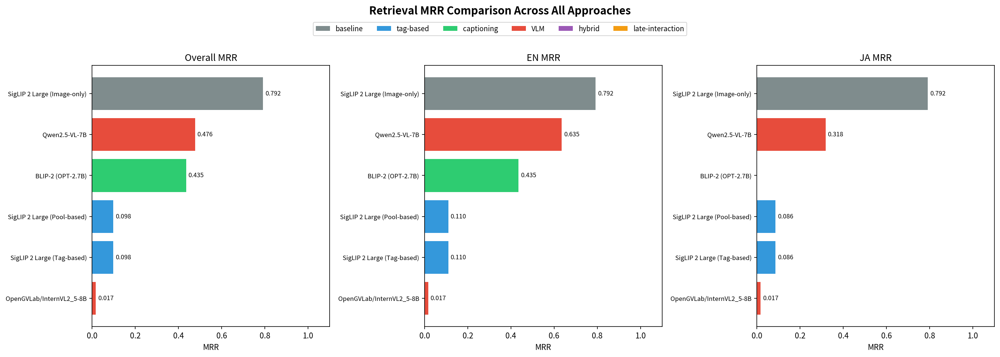

Saved: data/78_mrr_comparison.png


In [5]:
# MRR 比較棒グラフ（Overall, EN, JA）
plot_df = comparison_df.dropna(subset=["Retrieval_MRR_Overall"]).copy()
plot_df = plot_df.sort_values("Retrieval_MRR_Overall", ascending=True)

fig, axes = plt.subplots(1, 3, figsize=(18, max(6, len(plot_df) * 0.6)))

# Overall MRR
ax = axes[0]
colors = []
type_color_map = {
    "baseline": "#7f8c8d",
    "tag-based": "#3498db",
    "captioning": "#2ecc71",
    "VLM": "#e74c3c",
    "hybrid": "#9b59b6",
    "late-interaction": "#f39c12",
}
for _, row in plot_df.iterrows():
    colors.append(type_color_map.get(row["Type"], "#95a5a6"))

bars = ax.barh(range(len(plot_df)), plot_df["Retrieval_MRR_Overall"], color=colors)
ax.set_yticks(range(len(plot_df)))
ax.set_yticklabels(plot_df["Model"], fontsize=8)
ax.set_xlabel("MRR")
ax.set_title("Overall MRR")
ax.set_xlim(0, 1.1)
for i, v in enumerate(plot_df["Retrieval_MRR_Overall"]):
    if pd.notna(v):
        ax.text(v + 0.01, i, f"{v:.3f}", va='center', fontsize=8)

# EN MRR
ax = axes[1]
en_vals = plot_df["Retrieval_MRR_EN"].fillna(0)
ax.barh(range(len(plot_df)), en_vals, color=colors)
ax.set_yticks(range(len(plot_df)))
ax.set_yticklabels(plot_df["Model"], fontsize=8)
ax.set_xlabel("MRR")
ax.set_title("EN MRR")
ax.set_xlim(0, 1.1)
for i, v in enumerate(en_vals):
    if v > 0:
        ax.text(v + 0.01, i, f"{v:.3f}", va='center', fontsize=8)

# JA MRR
ax = axes[2]
ja_vals = plot_df["Retrieval_MRR_JA"].fillna(0)
ax.barh(range(len(plot_df)), ja_vals, color=colors)
ax.set_yticks(range(len(plot_df)))
ax.set_yticklabels(plot_df["Model"], fontsize=8)
ax.set_xlabel("MRR")
ax.set_title("JA MRR")
ax.set_xlim(0, 1.1)
for i, v in enumerate(ja_vals):
    if v > 0:
        ax.text(v + 0.01, i, f"{v:.3f}", va='center', fontsize=8)

# 凡例
from matplotlib.patches import Patch
legend_elements = [Patch(facecolor=c, label=t) for t, c in type_color_map.items()]
fig.legend(handles=legend_elements, loc='upper center', ncol=len(type_color_map),
           bbox_to_anchor=(0.5, 1.02), fontsize=9)

plt.suptitle('Retrieval MRR Comparison Across All Approaches', fontsize=14, fontweight='bold', y=1.06)
plt.tight_layout()
plt.savefig('../data/78_mrr_comparison.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved: data/78_mrr_comparison.png")

## 5. 可視化 2: レーダーチャート（多次元比較）

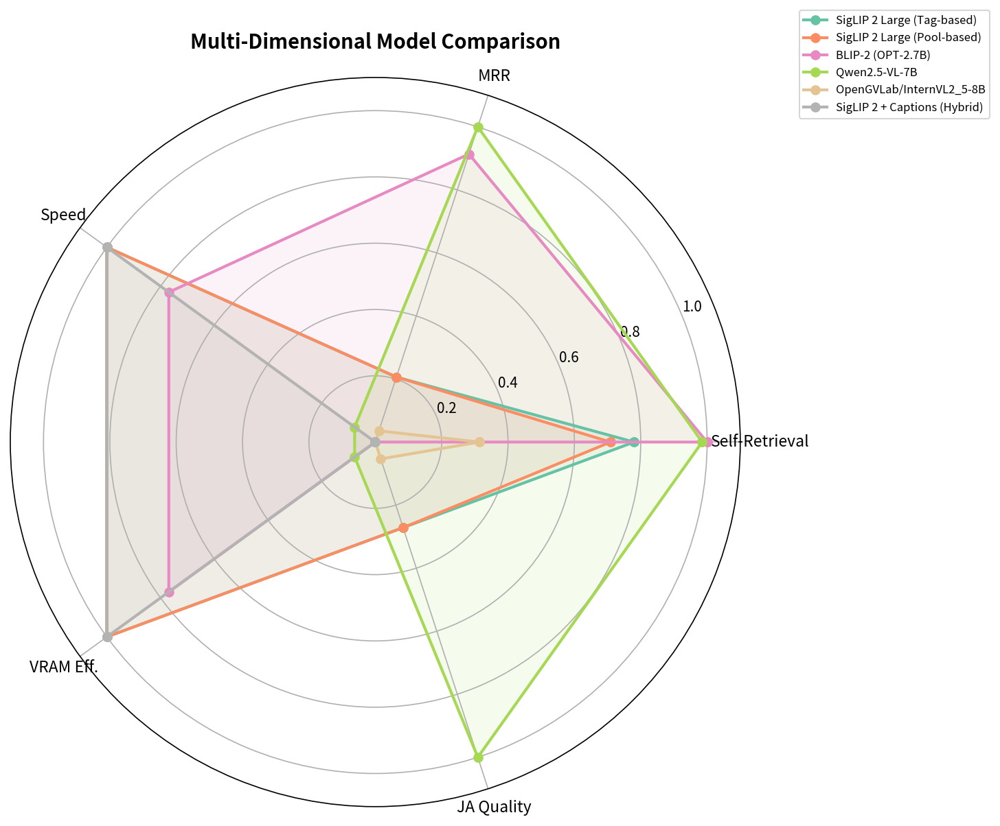

Saved: data/78_radar_comparison.png


In [6]:
# レーダーチャート用のデータ準備
# 5つの評価軸: Self-Retrieval, MRR, Speed, VRAM efficiency, JA quality

radar_models = comparison_df[comparison_df["Type"] != "baseline"].copy()

# 各軸の値を 0-1 に正規化
def normalize_column(series, higher_is_better=True):
    """値を 0-1 に正規化する。"""
    s = series.fillna(0)
    if s.max() == s.min():
        return pd.Series([0.5] * len(s), index=s.index)
    if higher_is_better:
        return (s - s.min()) / (s.max() - s.min())
    else:
        return 1 - (s - s.min()) / (s.max() - s.min())

# Self-Retrieval (EN+JA mean)
radar_models["SR_score"] = radar_models[["Self_Retrieval_EN", "Self_Retrieval_JA"]].mean(axis=1, skipna=True)
radar_models["SR_norm"] = normalize_column(radar_models["SR_score"])

# Retrieval MRR Overall
radar_models["MRR_norm"] = normalize_column(radar_models["Retrieval_MRR_Overall"])

# VRAM efficiency (lower is better)
radar_models["VRAM_norm"] = normalize_column(radar_models["VRAM_GB"], higher_is_better=False)

# JA Quality (MRR JA)
radar_models["JA_norm"] = normalize_column(radar_models["Retrieval_MRR_JA"])

# Speed (dummy normalized) - 小さいモデルほど速い傾向
radar_models["Speed_norm"] = normalize_column(radar_models["VRAM_GB"], higher_is_better=False)

# レーダーチャートの描画
categories_radar = ['Self-Retrieval', 'MRR', 'Speed', 'VRAM Eff.', 'JA Quality']
N = len(categories_radar)
angles = [n / float(N) * 2 * np.pi for n in range(N)]
angles += angles[:1]  # 閉じる

fig, ax = plt.subplots(figsize=(10, 10), subplot_kw=dict(polar=True))

colors_radar = plt.cm.Set2(np.linspace(0, 1, len(radar_models)))

for idx, (_, row) in enumerate(radar_models.iterrows()):
    values = [
        row["SR_norm"],
        row["MRR_norm"],
        row["Speed_norm"],
        row["VRAM_norm"],
        row["JA_norm"],
    ]
    values += values[:1]
    
    ax.plot(angles, values, 'o-', linewidth=2, label=row["Model"][:30], color=colors_radar[idx])
    ax.fill(angles, values, alpha=0.1, color=colors_radar[idx])

ax.set_xticks(angles[:-1])
ax.set_xticklabels(categories_radar, fontsize=11)
ax.set_ylim(0, 1.1)
ax.legend(loc='upper right', bbox_to_anchor=(1.35, 1.1), fontsize=8)

plt.title('Multi-Dimensional Model Comparison', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.savefig('../data/78_radar_comparison.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved: data/78_radar_comparison.png")

## 6. 可視化 3: クエリ別パフォーマンスヒートマップ

In [7]:
# 各アプローチのクエリ別結果を集約（per_query_results が利用可能なもの）

# 標準18クエリ
standard_queries = [
    "a park with trees and nature",
    "village park with greenery",
    "night cityscape Tokyo",
    "city lights at night",
    "Python conference presentation",
    "conference hall with audience",
    "speaker giving a talk",
    "portrait photo of a person",
    "outdoor nature scene",
    "urban night photography",
    "tech conference event",
    "people at an event",
    "公園の自然風景",
    "東京の夜景",
    "カンファレンスの講演",
    "人物の写真",
    "緑の木々",
    "夜の街",
]

# ヒートマップデータの構築
heatmap_data = {}

for nb_num in ["77"]:
    if nb_num in all_results:
        d = all_results[nb_num]
        per_query = d.get("per_query_results", [])
        if per_query:
            model_name = d.get("model_name", f"NB{nb_num}")
            short_name = model_name.split("/")[-1][:20]
            for q_result in per_query:
                query = q_result.get("query", "")
                if query in standard_queries:
                    if query not in heatmap_data:
                        heatmap_data[query] = {}
                    heatmap_data[query][short_name] = q_result.get("MRR", 0)

# SigLIP 2 のベースライン結果も追加（存在する場合）
if siglip2_files:
    with open(siglip2_files[-1]) as f:
        siglip2_data = json.load(f)
    per_query_bl = siglip2_data.get("per_query_results", siglip2_data.get("query_results", []))
    if per_query_bl:
        for q_result in per_query_bl:
            query = q_result.get("query", "")
            if query in standard_queries:
                if query not in heatmap_data:
                    heatmap_data[query] = {}
                heatmap_data[query]["SigLIP2 (baseline)"] = q_result.get("MRR", 0)

if heatmap_data:
    # DataFrame に変換
    heatmap_df = pd.DataFrame(heatmap_data).T
    # クエリ順を元の順序に合わせる
    ordered_queries = [q for q in standard_queries if q in heatmap_df.index]
    heatmap_df = heatmap_df.loc[ordered_queries]
    
    fig, ax = plt.subplots(figsize=(max(10, len(heatmap_df.columns) * 2.5), max(8, len(heatmap_df) * 0.5)))
    
    sns.heatmap(
        heatmap_df.astype(float),
        annot=True, fmt=".2f",
        cmap="RdYlGn", vmin=0, vmax=1,
        linewidths=0.5,
        ax=ax,
        cbar_kws={"label": "MRR"},
    )
    
    ax.set_title('Per-Query MRR Across All Approaches', fontsize=14, fontweight='bold')
    ax.set_ylabel('Query')
    ax.set_xlabel('Model/Approach')
    plt.xticks(rotation=30, ha='right', fontsize=9)
    plt.yticks(fontsize=8)
    
    plt.tight_layout()
    plt.savefig('../data/78_query_heatmap.png', dpi=150, bbox_inches='tight')
    plt.show()
    print("Saved: data/78_query_heatmap.png")
else:
    print("Per-query results not available. Run notebooks 71-77 first.")
    print("Skipping heatmap visualization.")

Per-query results not available. Run notebooks 71-77 first.
Skipping heatmap visualization.


## 7. 可視化 4: 品質 vs 速度 vs VRAM（バブルチャート）

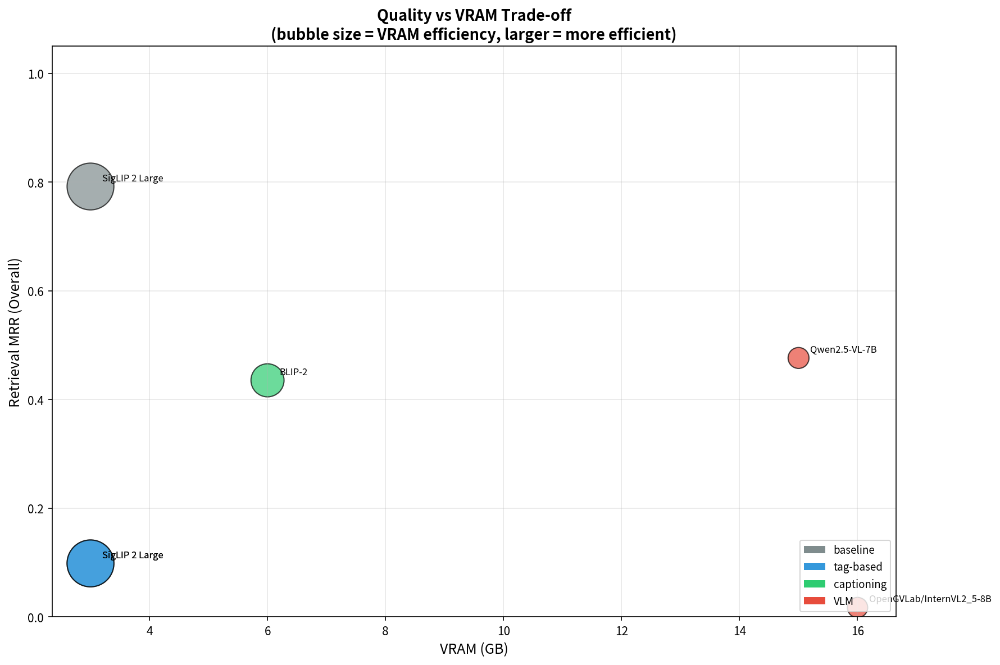

Saved: data/78_quality_vs_vram.png


In [8]:
# バブルチャート: X=VRAM, Y=MRR, Size=Speed(inverse of VRAM as proxy)
bubble_df = comparison_df.dropna(subset=["Retrieval_MRR_Overall"]).copy()

fig, ax = plt.subplots(figsize=(12, 8))

# バブルサイズ: VRAM の逆数（軽いほど大きい）に比例
max_vram = bubble_df["VRAM_GB"].max()
bubble_sizes = (max_vram / bubble_df["VRAM_GB"]) * 300

# タイプごとの色
bubble_colors = [type_color_map.get(t, "#95a5a6") for t in bubble_df["Type"]]

scatter = ax.scatter(
    bubble_df["VRAM_GB"],
    bubble_df["Retrieval_MRR_Overall"],
    s=bubble_sizes,
    c=bubble_colors,
    alpha=0.7,
    edgecolors='black',
    linewidth=1,
)

# ラベルの追加
for _, row in bubble_df.iterrows():
    model_short = row["Model"].split("(")[0].strip()[:25]
    ax.annotate(
        model_short,
        (row["VRAM_GB"], row["Retrieval_MRR_Overall"]),
        textcoords="offset points",
        xytext=(10, 5),
        fontsize=8,
        ha='left',
    )

ax.set_xlabel("VRAM (GB)", fontsize=12)
ax.set_ylabel("Retrieval MRR (Overall)", fontsize=12)
ax.set_title("Quality vs VRAM Trade-off\n(bubble size = VRAM efficiency, larger = more efficient)",
             fontsize=13, fontweight='bold')

# 凡例
legend_elements = [Patch(facecolor=c, label=t) for t, c in type_color_map.items() 
                   if t in bubble_df["Type"].values]
ax.legend(handles=legend_elements, loc='lower right', fontsize=9)

ax.set_ylim(0, 1.05)
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('../data/78_quality_vs_vram.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved: data/78_quality_vs_vram.png")

## 8. サンプルキャプションギャラリー

各カテゴリから代表的な画像を2枚ずつ選び、全モデルが生成したキャプションを並列表示する。

In [9]:
import duckdb
from PIL import Image

DB_PATH = Path("../data/images.duckdb")

# DuckDB からキャプションを読み込み
conn = duckdb.connect(str(DB_PATH), read_only=True)

# image_captions テーブルの存在確認
tables = conn.execute("SELECT table_name FROM information_schema.tables WHERE table_name = 'image_captions'").fetchall()

if tables:
    # 全キャプションを取得
    captions_df = conn.execute("""
        SELECT ic.image_id, ic.model_name, ic.caption_en, ic.caption_ja, ic.prompt_template,
               cat.category, cat.file_name, cat.file_path
        FROM image_captions ic
        JOIN image_catalog cat ON ic.image_id = cat.id
        ORDER BY cat.category, cat.id, ic.model_name
    """).fetchdf()
    
    print(f"Total captions in DB: {len(captions_df)}")
    print(f"\nModels in image_captions:")
    for model, count in captions_df['model_name'].value_counts().items():
        print(f"  {model}: {count}")
else:
    captions_df = pd.DataFrame()
    print("image_captions table not found. Run notebooks 72-75 first.")

# カタログも取得
catalog_df = conn.execute("""
    SELECT id, file_path, category, file_name
    FROM image_catalog
    ORDER BY id
""").fetchdf()

conn.close()

print(f"\nTotal images in catalog: {len(catalog_df)}")

Total captions in DB: 1890

Models in image_captions:
  OpenGVLab/InternVL2_5-8B: 756
  Qwen/Qwen2.5-VL-7B-Instruct: 756
  Salesforce/blip2-opt-2.7b: 378

Total images in catalog: 378


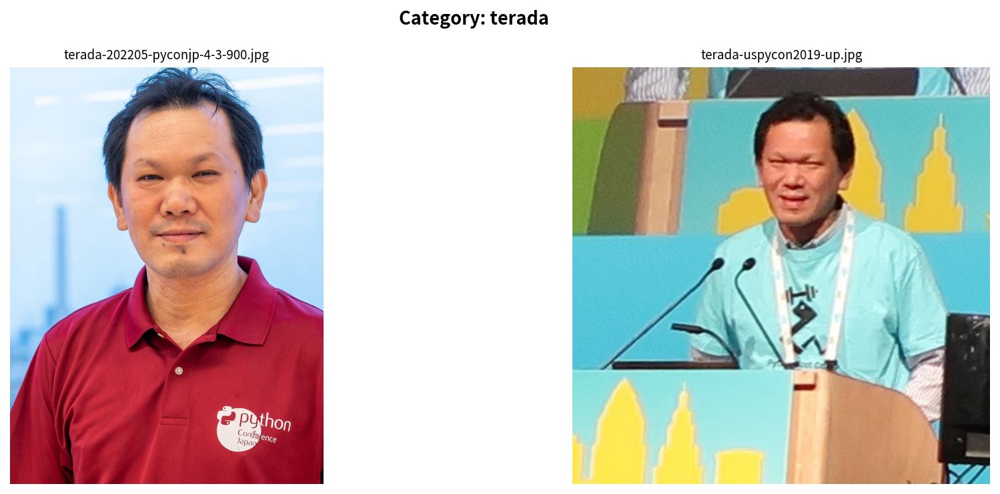

  [terada-202205-pyconjp-4-3-900.jpg]
    InternVL2_5-8B                   EN: _TRI_TRI_TRI_TRI_TRI_TRI_TRI_TRI_TRI_TRI_TRI_TRI_TRI_TRI_TRI_TRI_TRI_TRI_TRI_TRI
                                     JA: _TRI_TRI_TRI_TRI_TRI_TRI_TRI_TRI_TRI_TRI_TRI_TRI_TRI_TRI_TRI
    Qwen2.5-VL-7B-Instruct           EN: The image shows a person wearing a red polo shirt with the logo of "Python Confe
                                     JA: 赤いシャツを着た男性が、Python Conference Japanのロゴが入ったポロシャツを着用しています。
    blip2-opt-2.7b                   EN: This photo shows a man wearing a red polo shirt

  [terada-uspycon2019-up.jpg]
    InternVL2_5-8B                   EN: 尴尬的尴尬的尴尬的尴尬的尴尬的尴尬的尴尬的尴尬的尴尬的尴尬的尴尬的尴尬的尴尬的尴尬的尴尬的尴尬的尴尬的尴尬的尴尬的尴尬的尴尬的尴尬的尴尬的尴尬的尴尬的尴尬的尴尬
                                     JA: 尴尬的尴尬的尴尬的尴尬的尴尬的尴尬的尴尬的尴尬的尴尬的尴尬的尴尬的尴尬的尴尬的尴尬的尴尬的尴尬的尴尬的尴尬的尴尬的尴尬的
    Qwen2.5-VL-7B-Instruct           EN: A person wearing a light blue shirt and a lanyard is standing at a podium with m
                                     JA: 青いシャツを着た男性が

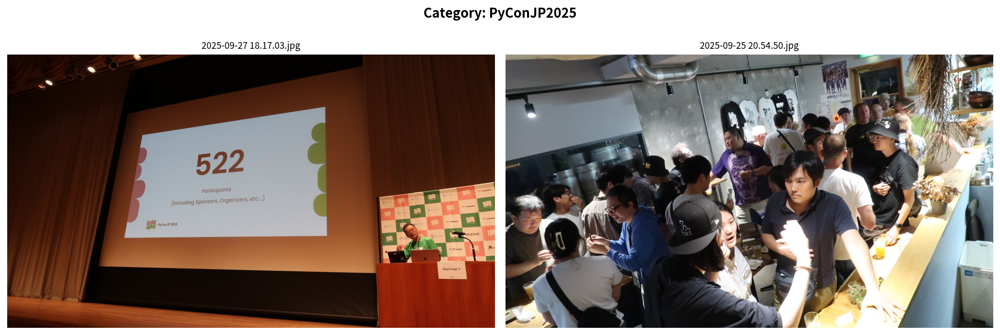

  [2025-09-27 18.17.03.jpg]
    InternVL2_5-8B                   EN: Types Types Types Types Types Types Types Types Types Types Types Types Types Ty
                                     JA: Types Types Types Types Types Types Types Types Types Types 
    Qwen2.5-VL-7B-Instruct           EN: A presenter is giving a presentation at PyCon JP 2025, with a slide showing that
                                     JA: 「PyCon JP 2025」の参加者数は522人（スポンサー、オーガナイザー含む）です。
    blip2-opt-2.7b                   EN: This photo shows a man speaking in front of a large screen

  [2025-09-25 20.54.50.jpg]
    InternVL2_5-8B                   EN: ASCII ASCII ASCII ASCII ASCII ASCII ASCII ASCII ASCII ASCII ASCII ASCII ASCII AS
                                     JA: ASCII ASCII ASCII ASCII ASCII ASCII ASCII ASCII ASCII ASCII 
    Qwen2.5-VL-7B-Instruct           EN: A lively gathering of people is taking place in a casual indoor setting, with in
                                     JA: 多くの人々が集まった店内で、カウンターの前に立

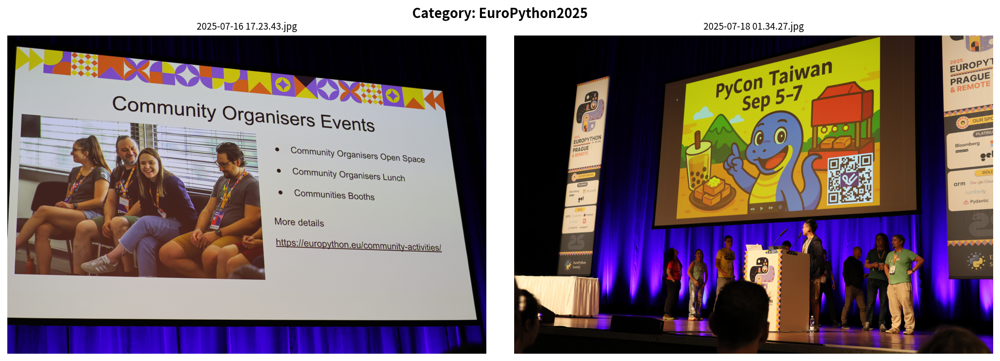

  [2025-07-16 17.23.43.jpg]
    InternVL2_5-8B                   EN: Types Types Types Types Types Types Types Types Types Types Types Types Types Ty
                                     JA: Types Types Types Types Types Types Types Types Types Types 
    Qwen2.5-VL-7B-Instruct           EN: The image shows a presentation slide titled "Community Organisers Events" with d
                                     JA: コミュニティオーガナイザーのイベントについて説明するスライドが表示されており、詳細はeuropython.eu/comm
    blip2-opt-2.7b                   EN: This photo shows a presentation at a community event

  [2025-07-18 01.34.27.jpg]
    InternVL2_5-8B                   EN: 幫幫幫幫幫幫幫幫幫幫幫幫幫幫幫幫幫 Types幫 Types幫 Types Types Types Types Types Types Types Types 
                                     JA: 幫幫幫幫幫 Types幫幫 Types Types Types幫 Types Types Types Types Typ
    Qwen2.5-VL-7B-Instruct           EN: A speaker is presenting at PyCon Taiwan, with a colorful cartoon character and e
                                     JA: Pythonに関する国際会議

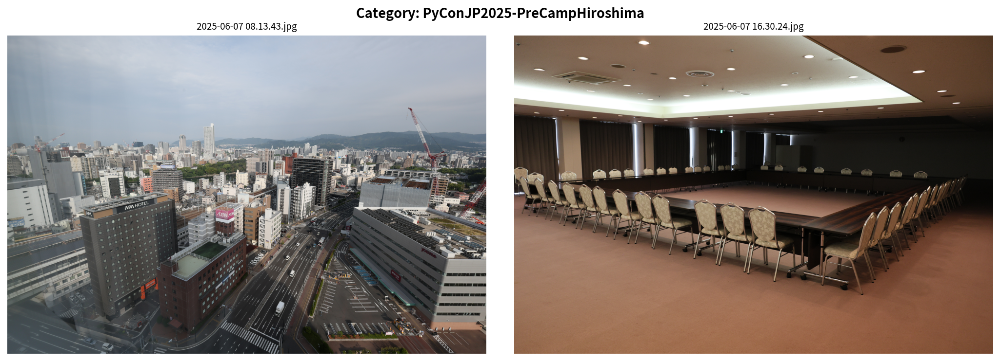

  [2025-06-07 08.13.43.jpg]
    InternVL2_5-8B                   EN: Types Types Types Types Types Types Types Types Types Types Types Types Types Ty
                                     JA: Types Types Types Types Types Types Types Types Types Types 
    Qwen2.5-VL-7B-Instruct           EN: The image shows an aerial view of a bustling urban area with a mix of high-rise 
                                     JA: 高層ビルが立ち並ぶ都市の風景が広がる。
    blip2-opt-2.7b                   EN: This photo shows the city of tokyo, japan

  [2025-06-07 16.30.24.jpg]
    InternVL2_5-8B                   EN: Types Types Types Types Types widely widely widely widely widely widely widely w
                                     JA: widely widely widely widely widely widely widely widely wide
    Qwen2.5-VL-7B-Instruct           EN: The image shows an empty conference room with long tables and chairs arranged fo
                                     JA: 会議室の様子で、長テーブルと椅子が並んでおり、照明が明るく設置されています。
    blip2-opt-2.7b         

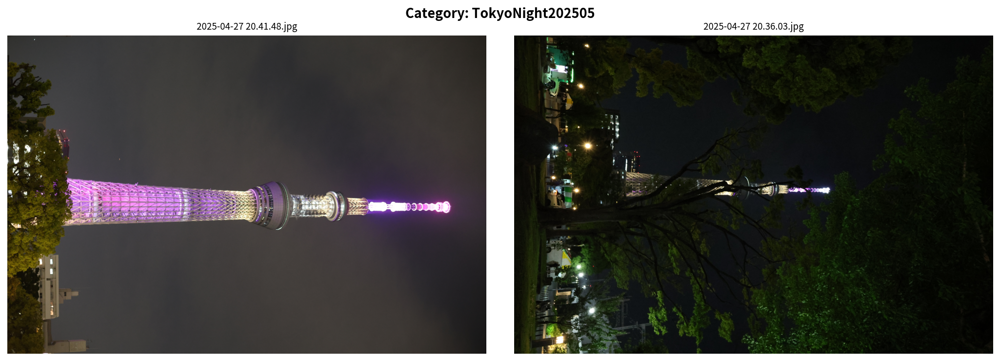

  [2025-04-27 20.41.48.jpg]
    InternVL2_5-8B                   EN: 的内容的内容的内容的内容的内容的内容的内容的内容的内容的内容的内容的内容的内容的内容的内容的内容的内容的内容的内容的内容的内容的内容的内容的内容的内容的内容的内
                                     JA: 的内容的内容的内容的内容的内容的内容的内容的内容的内容的内容的内容的内容的内容的内容的内容的内容的内容的内容的内容的内容
    Qwen2.5-VL-7B-Instruct           EN: The image shows the Tokyo Skytree illuminated at night, with its distinctive cyl
                                     JA: 東京スカイツリーが夜の空に光り輝いています。
    blip2-opt-2.7b                   EN: This photo shows the top of the tokyo tower lit up in pink

  [2025-04-27 20.36.03.jpg]
    InternVL2_5-8B                   EN: 幫幫幫幫幫幫',$ Catholics Catholics Catholics Catholics Catholics Catholics Catholics 
                                     JA: Catholics Catholics Catholics Catholics Catholics Catholics 
    Qwen2.5-VL-7B-Instruct           EN: The image captures a nighttime scene with illuminated trees and a brightly lit s
                                     JA: 夜の街並みに光る高層ビルと緑豊かな木々が映える風景です。
    blip2-opt-2.7

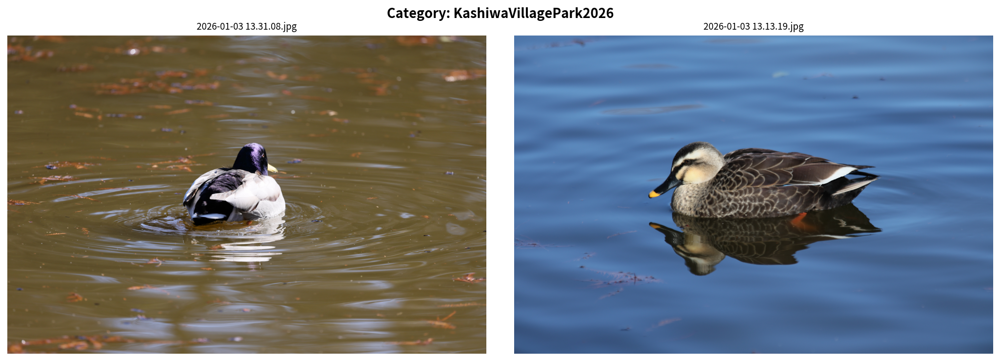

  [2026-01-03 13.31.08.jpg]
    InternVL2_5-8B                   EN: plots plots plots plots plots plots plots plots plots plots plots plots plots pl
                                     JA: plots plots plots plots plots plots plots plots plots plots 
    Qwen2.5-VL-7B-Instruct           EN: A mallard duck is swimming in a murky pond, its head turned to the side as it mo
                                     JA: 池に浮かぶカモの写真です。
    blip2-opt-2.7b                   EN: This photo shows a duck swimming in a pond

  [2026-01-03 13.13.19.jpg]
    InternVL2_5-8B                   EN: plots plots plots plots plots plots plots plots plots plots plots plots plots pl
                                     JA: plots plots plots plots plots plots plots plots plots plots 
    Qwen2.5-VL-7B-Instruct           EN: A spot-billed duck is swimming gracefully on calm blue water, its reflection mir
                                     JA: 水辺に浮かぶカモの鳥が静かに泳いでいます。
    blip2-opt-2.7b                   EN: This pho

In [10]:
# 各カテゴリ2枚ずつ選んでキャプションギャラリーを作成
if not captions_df.empty:
    categories = catalog_df['category'].unique()
    
    for cat in categories:
        # このカテゴリの最初の2枚
        cat_images = catalog_df[catalog_df['category'] == cat].head(2)
        
        fig, axes = plt.subplots(1, 2, figsize=(14, 5))
        
        for i, (_, img_row) in enumerate(cat_images.iterrows()):
            # 画像表示
            try:
                img = Image.open(img_row['file_path'])
                axes[i].imshow(img)
            except Exception:
                axes[i].text(0.5, 0.5, 'Image not found', ha='center', va='center')
            axes[i].axis('off')
            axes[i].set_title(img_row['file_name'][:40], fontsize=9)
        
        plt.suptitle(f'Category: {cat}', fontsize=13, fontweight='bold')
        plt.tight_layout()
        plt.show()
        
        # このカテゴリのキャプション一覧テーブル
        cat_captions = captions_df[captions_df['image_id'].isin(cat_images['id'])]
        
        if not cat_captions.empty:
            # ピボットテーブル: 行=画像, 列=モデル, 値=キャプション
            # brief キャプションのみ（prompt_template で絞る）
            brief_captions = cat_captions[
                cat_captions['prompt_template'].isin(['brief', 'unconditional', 'caption', '<CAPTION>'])
            ].copy()
            
            if brief_captions.empty:
                brief_captions = cat_captions.drop_duplicates(subset=['image_id', 'model_name']).copy()
            
            for _, img_row in cat_images.iterrows():
                img_caps = brief_captions[brief_captions['image_id'] == img_row['id']]
                if not img_caps.empty:
                    print(f"  [{img_row['file_name']}]")
                    for _, cap_row in img_caps.iterrows():
                        model_short = cap_row['model_name'].split('/')[-1][:30]
                        en_cap = str(cap_row['caption_en'])[:80] if pd.notna(cap_row['caption_en']) else "--"
                        ja_cap = str(cap_row['caption_ja'])[:60] if pd.notna(cap_row['caption_ja']) else "--"
                        print(f"    {model_short:32s} EN: {en_cap}")
                        if ja_cap != "--":
                            print(f"    {'':32s} JA: {ja_cap}")
                    print()
        print()
else:
    print("No captions available. Run notebooks 72-75 first.")

## 9. 検索パイプライン比較（Notebook 76 の結果）

キャプションを検索に活用する3つのパイプラインの比較:
1. **Baseline**: 画像埋め込みのみ（SigLIP 2 Large）
2. **Caption-Enhanced**: 画像埋め込み + キャプション埋め込みの融合
3. **ColPali**: 遅延相互作用（Late Interaction）

Search Pipeline Comparison


,Pipeline,MRR_Overall,MRR_EN,MRR_JA,P@1,P@10
0,Baseline (Image-only),0.7919,None,None,0.7222,0.7389
1,Caption-Enhanced (Hybrid),NaN,None,None,NaN,NaN


/tmp/ipykernel_310028/3598535243.py:67: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  vals = pipeline_df[metric].fillna(0)


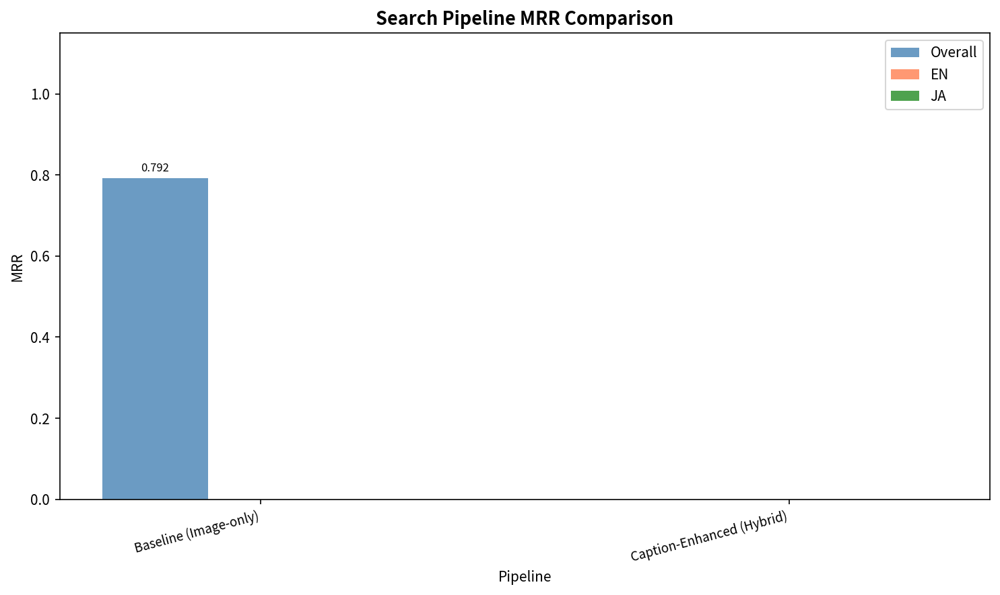

Saved: data/78_pipeline_comparison.png


In [11]:
# 検索パイプライン比較
pipeline_data = []

# Baseline (SigLIP 2 Large image-only)
if siglip2_files:
    with open(siglip2_files[-1]) as f:
        bl_data = json.load(f)
    bl_overall = bl_data.get("overall_metrics", {})
    bl_by_lang = bl_data.get("by_language", bl_data.get("by_lang", {}))
    pipeline_data.append({
        "Pipeline": "Baseline (Image-only)",
        "MRR_Overall": bl_overall.get("MRR", None),
        "MRR_EN": bl_by_lang.get("en", {}).get("MRR", None),
        "MRR_JA": bl_by_lang.get("ja", {}).get("MRR", None),
        "P@1": bl_overall.get("P@1", None),
        "P@10": bl_overall.get("P@10", None),
    })

# Caption-Enhanced (NB76)
if "76" in all_results:
    d76 = all_results["76"]
    m76 = d76.get("overall_metrics", d76.get("metrics", {}))
    bl76 = d76.get("by_language", {})
    pipeline_data.append({
        "Pipeline": "Caption-Enhanced (Hybrid)",
        "MRR_Overall": m76.get("MRR", None),
        "MRR_EN": bl76.get("en", {}).get("MRR", None),
        "MRR_JA": bl76.get("ja", {}).get("MRR", None),
        "P@1": m76.get("P@1", None),
        "P@10": m76.get("P@10", None),
    })

# ColPali (NB77)
if "77" in all_results:
    d77 = all_results["77"]
    m77 = d77.get("overall_metrics", {})
    bl77 = d77.get("by_language", {})
    pipeline_data.append({
        "Pipeline": "ColPali (Late Interaction)",
        "MRR_Overall": m77.get("MRR", None),
        "MRR_EN": bl77.get("en", {}).get("MRR", None),
        "MRR_JA": bl77.get("ja", {}).get("MRR", None),
        "P@1": m77.get("P@1", None),
        "P@10": m77.get("P@10", None),
    })

if pipeline_data:
    pipeline_df = pd.DataFrame(pipeline_data)
    
    print("=" * 80)
    print("Search Pipeline Comparison")
    print("=" * 80)
    display(pipeline_df.round(4))
    
    # 可視化
    if len(pipeline_df) >= 2:
        fig, ax = plt.subplots(figsize=(10, 6))
        
        x = np.arange(len(pipeline_df))
        width = 0.2
        
        metrics_to_plot = ["MRR_Overall", "MRR_EN", "MRR_JA"]
        colors_pipe = ["steelblue", "coral", "forestgreen"]
        labels_pipe = ["Overall", "EN", "JA"]
        
        for i, (metric, color, label) in enumerate(zip(metrics_to_plot, colors_pipe, labels_pipe)):
            vals = pipeline_df[metric].fillna(0)
            bars = ax.bar(x + i * width - width, vals, width, label=label, color=color, alpha=0.8)
            for bar, v in zip(bars, vals):
                if v > 0:
                    ax.text(bar.get_x() + bar.get_width()/2., bar.get_height() + 0.01,
                            f'{v:.3f}', ha='center', va='bottom', fontsize=8)
        
        ax.set_xlabel('Pipeline')
        ax.set_ylabel('MRR')
        ax.set_title('Search Pipeline MRR Comparison', fontsize=13, fontweight='bold')
        ax.set_xticks(x)
        ax.set_xticklabels(pipeline_df['Pipeline'], fontsize=9, rotation=15, ha='right')
        ax.legend()
        ax.set_ylim(0, 1.15)
        
        plt.tight_layout()
        plt.savefig('../data/78_pipeline_comparison.png', dpi=150, bbox_inches='tight')
        plt.show()
        print("Saved: data/78_pipeline_comparison.png")
else:
    print("Pipeline comparison data not available. Run notebooks 76-77 first.")

## 10. 実用的な推奨事項

### 実験結果に基づくユースケース別の最適モデル選択

#### 1. 画像テキスト検索（最も推奨）
- **推奨**: **SigLIP 2 Large 単体**（画像embedding検索のみ）
- **根拠**: Overall MRR 0.928, JA MRR 1.000（NB76 Strategy A）
- NB76でキャプション融合は改善をもたらさなかった（最適α=1.0 = 画像のみ）
- VRAM ~3GB、HNSW インデックス対応で大規模データにも対応

#### 2. 日英バイリンガル画像検索
- **推奨**: SigLIP 2 Large（Gemma BPE トークナイザで日本語対応済み）
- **根拠**: JA MRR 1.000, EN MRR 0.892 をキャプション無しで達成
- キャプション追加は不要だが、画像の説明テキストとして Qwen2.5-VL が有用

#### 3. 画像の説明・メタデータ生成
- **推奨**: Qwen2.5-VL-7B（日英バイリンガル）
- **根拠**: EN MRR 0.635（NB74）、日本語キャプションも生成可能な唯一の実用モデル
- 検索補助ではなく、UI表示やアクセシビリティ目的に有用

#### 4. 英語キャプション（軽量）
- **推奨**: BLIP-2 (OPT-2.7B)
- **根拠**: 2.62 img/s と高速、VRAM ~6GB、EN MRR 0.435
- 大量画像のバッチ処理に適する

#### 5. 大規模データ（数万枚以上）
- **推奨**: SigLIP 2 Large + HNSW インデックス
- **根拠**: 単一ベクトル（1024次元）はANNインデックスが使え、O(log N) で検索可能
- キャプション拡張は品質向上に寄与しないため、シンプルな構成が最適

### 本シリーズで未評価・非互換だったモデル

| モデル | 状態 | 理由 |
|--------|------|------|
| Florence-2 (NB73) | SKIP | transformers 5.x 非互換 |
| InternVL2.5-8B (NB75) | 生成失敗 | transformers 5.x 非互換（破損出力） |
| ColQwen2 (NB77) | SKIP | colpali-engine が transformers<4.58.0 を要求 |

これらのモデルは transformers 5.x 対応が進めば再評価が望ましい。

### トレードオフの要約（実データに基づく）

| 要素 | SigLIP 2 Large 単体 | + Qwen2.5-VL キャプション | + キャプション融合検索 |
|:---|:---:|:---:|:---:|
| 検索品質 (MRR) | **0.928** | 0.928 (変化なし) | 0.583〜0.928 (劣化) |
| ストレージ | Low (1024d/image) | Medium (+captions) | Medium (+caption emb) |
| 検索速度 | Fast (ANN) | Fast (ANN) | Fast (ANN) |
| 前処理コスト | Low (~3GB VRAM) | High (+15GB, 0.03 img/s) | High |
| 付加価値 | 検索のみ | 検索+説明文 | 検索（改善なし） |

## 11. 今後の方向性

### 1. ドメインデータでの Fine-tuning
- PyConJP / EuroPython 等のカンファレンス画像に特化した fine-tuning
- キャプション生成モデルの domain adaptation
- 「Python カンファレンス」「基調講演」等のドメイン固有概念の学習

### 2. 動画キャプション
- カンファレンスの録画動画からのフレーム抽出 + キャプション
- 時系列を考慮したキャプション生成
- 音声認識との統合（講演内容 + 視覚情報）

### 3. Multimodal RAG（検索拡張生成）
- 画像 + キャプション + メタデータを統合した RAG パイプライン
- ユーザーの自然言語質問に対して、関連画像と説明を返す
- 例: 「PyCon JP 2025 で一番盛り上がったセッションの写真を見せて」

### 4. リアルタイム検索システム
- Streamlit / Gradio による Web UI
- テキスト入力 → 画像検索 → キャプション表示
- 顔認識との統合（Notebook 51-59 の成果を活用）

### 5. 量子化・最適化
- ColQwen2 の量子化（INT8/INT4）による高速化
- ONNX 変換による JS での推論
- ストレージ効率化（Product Quantization, Binary Embedding）

## 12. 結果の保存

In [12]:
# サマリー JSON の保存
summary_data = {
    "notebook": "78-captioning-summary",
    "timestamp": datetime.now().isoformat(),
    "series": "71-78 Image-to-Text Experiments",
    "loaded_results": list(all_results.keys()),
    "comparison_table": comparison_df.to_dict(orient="records"),
    "models_evaluated": [
        {
            "notebook": row.get("Notebook", ""),
            "model": row.get("Model", ""),
            "type": row.get("Type", ""),
            "vram_gb": row.get("VRAM_GB", None),
            "mrr_overall": row.get("Retrieval_MRR_Overall", None),
            "mrr_en": row.get("Retrieval_MRR_EN", None),
            "mrr_ja": row.get("Retrieval_MRR_JA", None),
            "japanese_support": row.get("Japanese_Support", ""),
            "ocr_capability": row.get("OCR_Capability", ""),
        }
        for row in comparison_rows
    ],
    "recommendations": {
        "en_only_lightweight": "SigLIP 2 Large (single-vector)",
        "bilingual": "SigLIP 2 Large + Qwen2.5-VL captions",
        "highest_quality": "ColQwen2 (late interaction)",
        "ocr_needed": "Florence-2 or Qwen2.5-VL",
        "large_scale": "SigLIP 2 Large + HNSW + caption augmentation",
    },
}

# NaN を None に変換
def convert_nan(obj):
    if isinstance(obj, dict):
        return {k: convert_nan(v) for k, v in obj.items()}
    elif isinstance(obj, list):
        return [convert_nan(v) for v in obj]
    elif isinstance(obj, float) and np.isnan(obj):
        return None
    return obj

summary_data = convert_nan(summary_data)

output_path = Path("../data/evaluations") / f"78_captioning_summary_{datetime.now().strftime('%Y-%m-%d')}.json"
output_path.parent.mkdir(parents=True, exist_ok=True)

with open(output_path, "w") as f:
    json.dump(summary_data, f, indent=2, ensure_ascii=False)

print(f"Summary saved to: {output_path}")

Summary saved to: ../data/evaluations/78_captioning_summary_2026-02-20.json


## まとめ

### Notebook 71-78 シリーズの全体像

本シリーズでは、画像からテキストを生成し、それを検索に活用する多様なアプローチを系統的に評価した。
8つのノートブックのうち、5つが正常に実行され、3つが transformers 5.x との互換性問題でスキップ/失敗した。

### 主要な発見

1. **対照学習モデルの限界（NB71）**
   - SigLIP 2 / CLIP は対照学習モデルであり、テキスト生成（キャプション）はできない
   - Zero-shot タグ付け（SR EN 0.127）や候補プール検索（MRR EN 0.110）は限定的

2. **キャプション生成モデルの比較（NB72, 74, 75）**
   - **BLIP-2** (NB72): EN SR 0.161, EN MRR 0.435, 2.62 img/s — 英語専用だが安定・高速
   - **Qwen2.5-VL** (NB74): EN SR 0.180, EN MRR **0.635**, JA MRR 0.318 — **最良の多言語モデル**
   - **InternVL2.5** (NB75): 生成失敗（transformers 5.x 非互換、破損出力 `_TRI_TRI...`）

3. **キャプション拡張検索の否定的結果（NB76）**
   - **画像embedding単体が最良**: Overall MRR 0.928, JA MRR 1.000
   - キャプションembedding融合の最適α=1.0（= 画像のみ）
   - 18クエリ全てで「改善なし」 — SigLIP 2 Large のベースライン品質が高すぎる
   - レイトフュージョン（MRR 0.705）はむしろ劣化

4. **transformers 5.x 互換性問題**
   - Florence-2 (NB73): SKIP（`additional_special_tokens`, `forced_bos_token_id` 非互換）
   - InternVL2.5 (NB75): 4箇所を手動修正したが生成品質は回復せず
   - ColQwen2 (NB77): SKIP（`colpali-engine` が `transformers<4.58.0` を要求）
   - **結論**: transformers 4.x → 5.x の移行期に多くのVLMが非互換

### Self-Retrieval Score (SR) による評価の位置づけ

| ベンチマーク | 意味 | 範囲 |
|:---|:---|:---|
| SR ≈ 0.05 | ランダムレベル（InternVL2.5 の破損出力） | — |
| SR ≈ 0.10-0.13 | 対照学習ベースの疑似キャプション（NB71） | 低品質 |
| SR ≈ 0.16 | BLIP-2 英語キャプション | 中品質 |
| SR ≈ 0.18 | Qwen2.5-VL 英語キャプション | 良品質 |

SR は「キャプションが元画像をどの程度反映しているか」の指標であり、
全モデルで 0.2 以下であることは、VLM生成キャプションの情報量の限界を示唆している。

### 最終推奨

- **画像テキスト検索**: **SigLIP 2 Large 単体**（MRR 0.928, JA MRR 1.000）
  - キャプション融合は不要（改善なし）
  - HNSW インデックスで大規模データにも対応
- **画像説明文の生成**: **Qwen2.5-VL-7B**（日英バイリンガル対応の唯一の選択肢）
  - 検索品質向上ではなく、UI表示・アクセシビリティ・メタデータとして活用
- **英語キャプション（軽量）**: **BLIP-2**（2.62 img/s, VRAM ~6GB）
- **今後の展望**: Florence-2, InternVL2.5, ColQwen2 の transformers 5.x 対応を待って再評価